In [126]:
# import libraries

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.io import loadmat
import torch
import torchvision
import torchvision.transforms as transforms
from PIL import Image
import torchvision.models as models

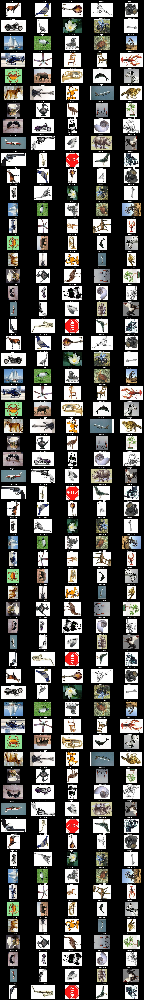

In [127]:
# load stimuli
stimuli = loadmat('natural_stim_50_rotated_90.mat')['stim']

# display the stimuli
fig, ax = plt.subplots(60, 5, figsize=(20, 140))
for i, img_arr in enumerate(stimuli):
    ax[i//5, i%5].imshow(img_arr[0], cmap='gray')
    ax[i//5, i%5].axis('off')
    ax[i//5, i%5].set_title(f'Image {i+1}')
plt.show()


In [128]:
print(stimuli.shape)
print(stimuli[0].shape)
print(stimuli[0][0].shape)

(300, 1)
(1,)
(277, 300, 3)


In [129]:
def calculateMirrorConfusionIndex(original, horizontal, vertical):
    original = original.view(original.size(0), -1)
    horizontal = horizontal.view(horizontal.size(0), -1)
    vertical = vertical.view(vertical.size(0), -1)
    d_h = torch.norm(original - horizontal, dim=None)
    d_v = torch.norm(original - vertical, dim=None)
    mirror_confusion_index = (d_h - d_v) / (d_h + d_v)
    return mirror_confusion_index

In [130]:
vgg16 = models.vgg16(pretrained=True)
vgg16.eval()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vgg16.to(device)

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

embeddings = []
num_images = stimuli.shape[0]
vgg16Features = vgg16.features
vgg16AvgPool = vgg16.avgpool
vgg16Linear = vgg16.classifier
for i in range(num_images):
    embeddings.append([])
    original_img = Image.fromarray(stimuli[i][0])
    if original_img.mode != 'RGB':
        original_img = original_img.convert('RGB')
    horizontal_img = original_img.transpose(Image.FLIP_TOP_BOTTOM)
    vertical_img = original_img.transpose(Image.FLIP_LEFT_RIGHT)
    original_tensor = preprocess(original_img).unsqueeze(0).to(device)
    horizontal_tensor = preprocess(horizontal_img).unsqueeze(0).to(device)
    vertical_tensor = preprocess(vertical_img).unsqueeze(0).to(device)

    with torch.no_grad():
        for layer in vgg16Features:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

            if isinstance(layer, torch.nn.Conv2d):
                confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
                embeddings[-1].append(confusion_index)

        original_tensor = torch.flatten(vgg16AvgPool(original_tensor))
        horizontal_tensor = torch.flatten(vgg16AvgPool(horizontal_tensor))
        vertical_tensor = torch.flatten(vgg16AvgPool(vertical_tensor))

        for layer in vgg16Linear:
            original_tensor = layer(original_tensor)
            horizontal_tensor = layer(horizontal_tensor)
            vertical_tensor = layer(vertical_tensor)

            if isinstance(layer, torch.nn.Linear):
                confusion_index = calculateMirrorConfusionIndex(original_tensor, horizontal_tensor, vertical_tensor)
                embeddings[-1].append(confusion_index)

c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\ProgramData\anaconda3\envs\pytorch\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [131]:
print(f'Layers: {embeddings[0].__len__()}')

Layers: 16


In [132]:
fig, ax = plt.subplots(num_images, 1, figsize=(20, 600))
for i, embedding in enumerate(embeddings):
    np_embedding = [e.cpu().numpy() for e in embedding]
    ax[i].plot(range(len(embedding)), np_embedding, marker='o')
    ax[i].set_ylim(-1, 1)
    ax[i].set_title(f'Image {i+1}')
    ax[i].set_xlabel('Layer')
    ax[i].set_ylabel('Mirror Confusion Index')
    ax[i].set_xticks(range(len(embedding)))
    ax[i].set_xticklabels(range(1, len(embedding)+1))
plt.show()
